In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Introduction

This notebook is based on Section 4.3 of [this paper](http://www.columbia.edu/~jw2966/papers/CLMW11-JACM.pdf).  The idea is to use convex optimization to separate the background and foreground in surveillance video footage.  The following cell loads some frames of a surveillance video.  The frames are taken from the file `VIRAT_S_010204_01_000072_000225.mp4` in the [VIRAT Video Dataset](https://viratdata.org/).  I have converted the frames to black and white and scaled them down to simplify and speed up the computations.

In [ ]:
data = np.load('frames.npz')

M = data['M']
h,w = data['s']

print('M has size {}x{}'.format(*M.shape))
print('loaded {} images'.format(M.shape[1]))
print('images have size {}x{}'.format(h,w))

M has size 230400x18
loaded 18 images
images have size 360x640


As you can see, the code loads a $230,400\times18$ matrix $M$.  Each column of $M$ encodes one frame of the video.  Originally, each image is represented as a $360\times640$ array of values between $0$ and $1$, describing the color of the pixels in the image. Black pixels are encoded as $0$, white pixels as $1$. Intermediate values correspond to different shades of gray.

To generate a column of $M$, I have taken the corresponding $360\times640$ array for the image and collapsed it into a 1D column array by taking the entries in [row-major](https://en.wikipedia.org/wiki/Row-_and_column-major_order) order.

The following code cell shows how to draw the images.  It loops over the columns of $M$ and reshapes each column back to a $360\times 640$ array.  This array is this passed to `matplotlib`'s `imshow` function, which draws the array as a grayscale image.

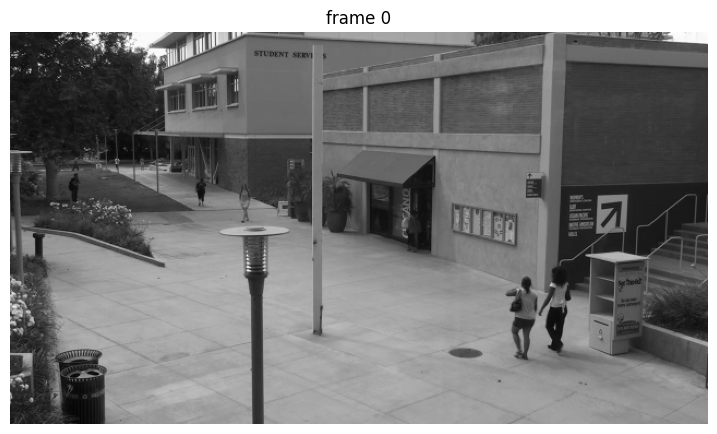

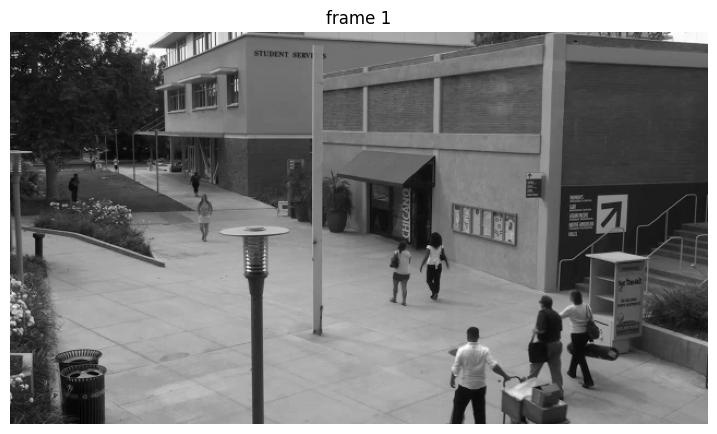

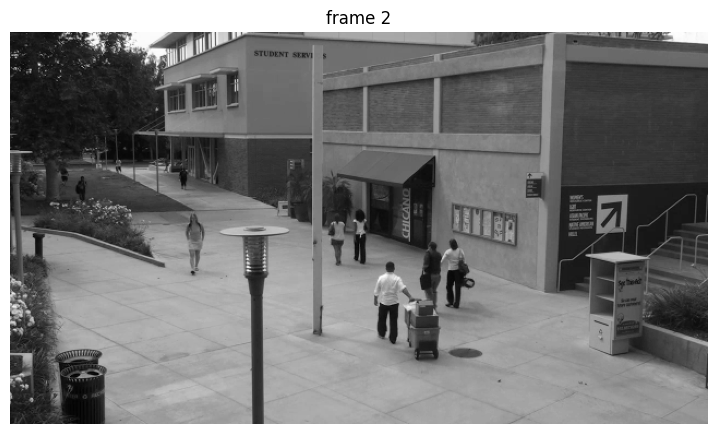

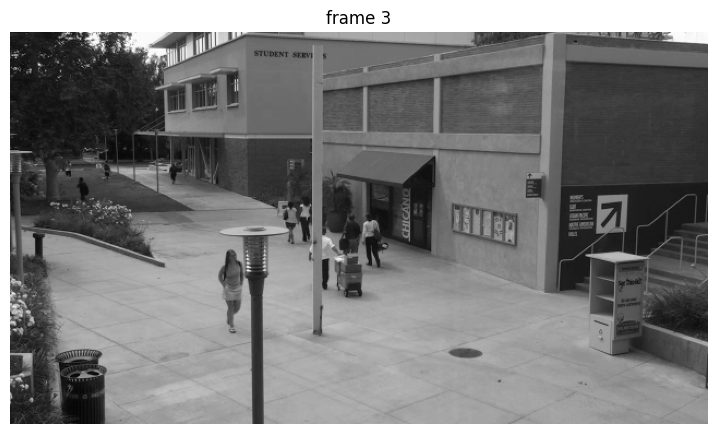

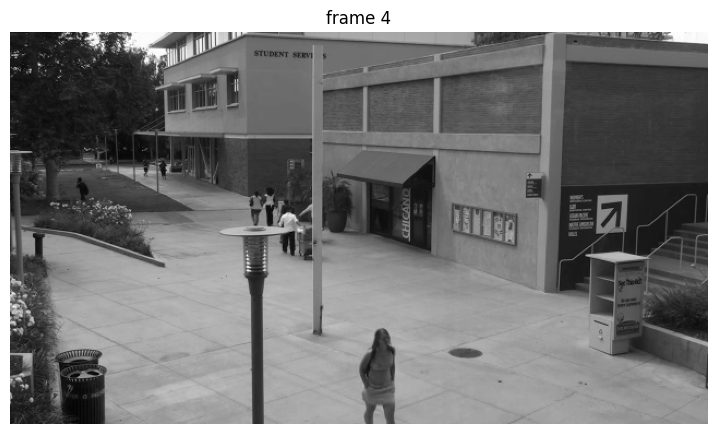

...

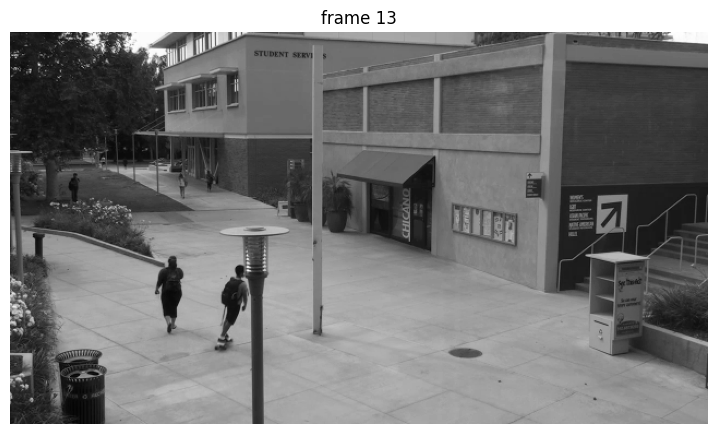

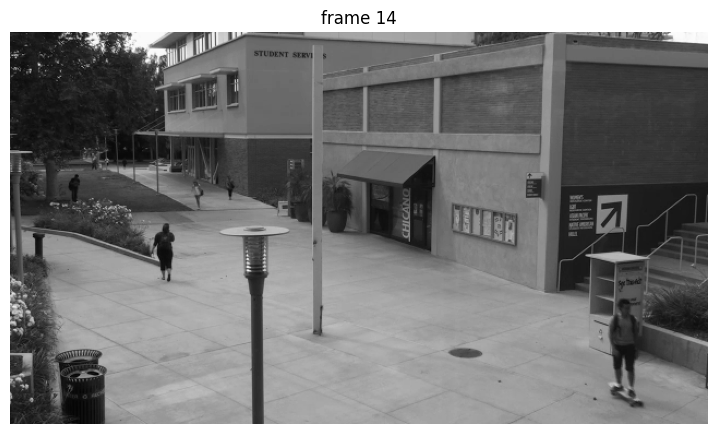

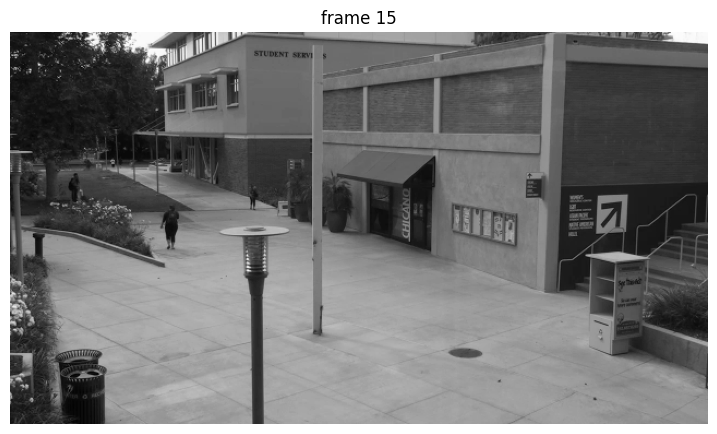

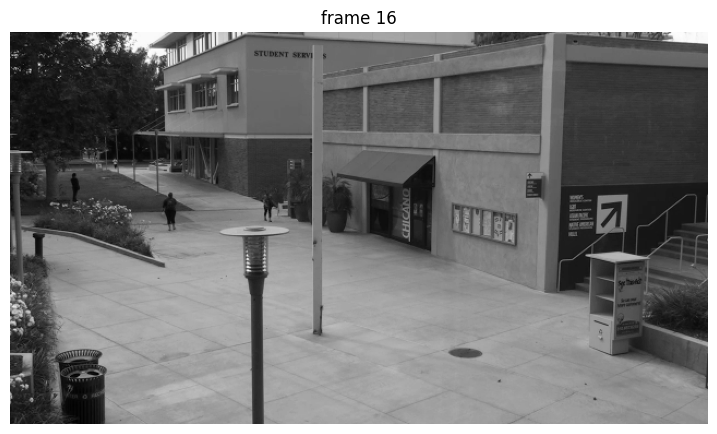

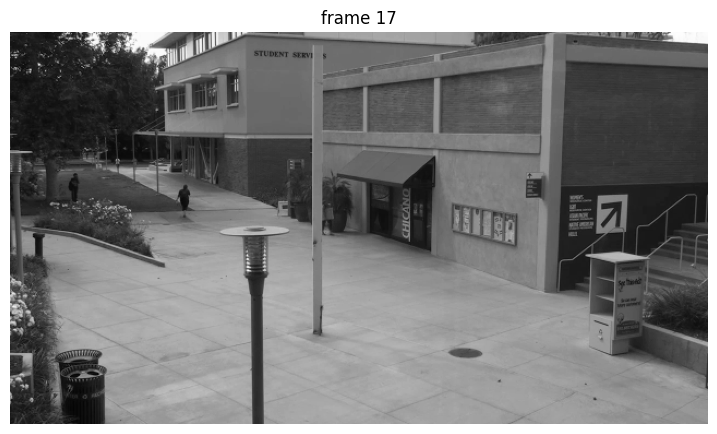

In [ ]:
# scale factor for drawing figures
scl = 0.025

for i in range(M.shape[1]):
    plt.figure(figsize=(h * scl, w * scl))
    plt.imshow(M[:, i].reshape(h, w), cmap='gray')
    plt.axis('off')
    plt.title('frame {}'.format(i))

# The model

Conceptually, we think of a video frame as a sum of two pieces,

$$
\text{frame} = \text{background} + \text{foreground}.
$$

Since the camera is stationary, we expect that the background is essentially constant across all images.  The video frames only differ on a small set of pixels where the foreground objects are located. In other words, we suppose that each frame is composed as a sum of a fixed background plus a sparse array that adds the foreground objects.

Once the images are stacked into $M$, this results in the model

$$
M = L + S,
$$

where $L$ is the background and $S$ is the foreground.  Since the background doesn't change (much) from frame to frame, we expect the columns of $L$ to be essentially identical.  In other words, $L$ should be a rank one matrix (or very close).

On the other hand, the foreground part of the image only affects relatively few pixels in the frame, so we expect $S$ to be a sparse matrix.  In other words, to discover the background and foreground of the video, we want to decompose $M$ as the sum of a low-rank matrix and a sparse matrix.

# A convex optimization problem

As we've discussed before, minimizing the $1$-norm tends to lead to sparse solutions.  To match with the notation of the paper, we'll write the 1-norm of an $n_1\times n_2$ matrix $S$ as

$$
\|S\|_1 = \sum_{i=1}^{n_1}\sum_{j=1}^{n_2}|s_{ij}|.
$$

(Sometimes the notation $\|S\|_1$ is used to denote the operator 1-norm, which is another common norm in linear algebra. When you see norm notation, it's a good idea to read carefully to be sure you know exactly what norm is being discussed.)  If we include $\|S\|_1$ in our optimization objective, we'll tend to select sparse $S$.

Interestingly, there is an analogous norm for matrices that tends to favor low-rank matrices when minimized.  This is called the **nuclear norm**, defined as

$$
\|L\|_* = \text{trace}\sqrt{L^TL}.
$$

As described in the paper, we can look for a suitable decomposition of $M=L+S$ by considering the convex optimization problem

$$
\begin{split}
\underset{L,S}{\text{minimize}}&\quad \|L\|_* + \lambda\|S\|_1\\
\text{subject to}&\quad L + S = M.
\end{split}
$$

Intuitively, we want to make $L$ low rank and $S$ sparse.  The paper also describes how to choose a good value of the hyperparameter $\lambda$.  Namely, $\lambda = 1/\sqrt{n_1}$.

# A numerical algorithm

Since cvxpy knows about both norms in this formulation, it is possible to use cvxpy as a solver.  However, for this size of problem, the solution will take a long time.  Fortunately, the paper proposes a much more efficient approach.  The approach uses two special operators.

The first, the paper calls the **shrinkage operator**, $\mathcal{S}_\tau$.  This operator is first defined on the real line as
$$
\mathcal{S}_\tau(x) = \text{sign}(x)\max\{|x|-\tau,0\}.
$$
The shrinkage operator can then be applied to a matrix elementwise.

The second operator is what the paper calls the **singular value thresholding operator**, $\mathcal{D}_\tau$.  This operator is defined on matrices through the singular value decomposition (SVD).  If you don't know or don't remember the theory behind the SVD, don't worry, you'll still be able to complete this assignment.  For those who do know it, $\mathcal{D}_\tau$ is defined as follows.  Let $X$ be a matrix and let $X=U\Sigma V^T$ be an SVD of $X$.  Then,
$$
\mathcal{D}_\tau(X) = U\mathcal{S}_\tau(\Sigma)V^T.
$$

The shrinkage and threshold operators are defined in the cell below.

In [ ]:
def shrink(x, tau):
    return np.sign(x) * np.maximum(np.abs(x) - tau, 0)


def thresh(X, tau):
    U, s, VT = np.linalg.svd(X, full_matrices=False)
    s = shrink(s, tau)
    return (U * s).dot(VT)

The algorithm in the paper produces a sequence of matrix pairs $(L_k,S_k)$ for $k=0,1,2,\ldots$. As $k\to\infty$, $L_k$ and $S_k$ approach a minimizer of the convex optimization problem.

## 💻 Exercise

Find Algorithm 1 on page 11:28 of the paper linked above and implement it in the code cell below.

```python
# define the lambda and mu hyperparameters
lam = 1 / np.sqrt(M.shape[0])
mu = 0.25 * M.shape[0] * M.shape[1] / np.sum(np.abs(M))

# define the arrays S, L, and Y (using np.zeros_like)
S = np.zeros_like(M)
L = np.zeros_like(M)
Y = np.zeros_like(M)

# calculate the Frobenius norm of M
M_F = np.linalg.norm(M, 'fro')

# do some iterations
for i in range(200):
    # update the variables according to the algorithm
    L = thresh(M - S + (1 / mu) * Y, 1 / mu)
    S = shrink(M - L + (1 / mu) * Y, lam / mu)
    Y += mu * (M - L - S)

    # print some convergence information
    if (i + 1) % 10 == 0:
        print('iteration {:3d} rel err = {:.5e}'.format(i + 1, (np.linalg.norm(M - L - S, 'fro')) / M_F))
```

**Notes:**

1. The [Frobenius norm](https://en.wikipedia.org/wiki/Matrix_norm#Frobenius_norm) parts are related to the convergence criterion described in the paper. The paper recommends running the algorithm until $\|M-L-S\|_F/\|M\|_F$ is small. For this code, I've just suggested that you run 200 iterations to get started. If you've written your part correctly, this should be enough for the algorithm to produce a good solution.
2. The algorithm defines sequences of each variable $\{S_k\}$, $\{L_k\}$ and $\{Y_k\}$. If you look carefully at the algorithm, you'll realize that you don't have to keep all of these matrices. For example, $L_{k+1}$ depends on $L_k$, $S_k$ and $Y_k$. Once that is computed, $L_k$ is never needed again. This means that the calculation can be done "in place", as suggested by the code outline above. As long as you first update, $L$, then $S$ and then $Y$, you can implement the algorithm without keeping track of previous values of the variables.
3. The code will take a couple of minutes to execute, so be patient. If your code is taking longer than 2-3 minutes, you probably did something wrong. Double-check your implementation or ask me for help.

In [6]:
# define the lambda and mu hyperparameters
lam = 1 / np.sqrt(M.shape[0])
mu = 0.25 * M.shape[0] * M.shape[1] / np.sum(np.abs(M))

# YOUR CODE HERE
# Define the arrays S, L, and Y
S = np.zeros_like(M)
L = np.zeros_like(M)
Y = np.zeros_like(M)

# Calculate the Frobenius norm of M
M_F = np.linalg.norm(M, 'fro')

# Do some iterations
for i in range(200):
    # Update the variables according to the algorithm
    L = thresh(M - S + (1 / mu) * Y, 1 / mu)
    S = shrink(M - L + (1 / mu) * Y, lam / mu)
    Y += mu * (M - L - S)

    # Print some convergence information
    if (i + 1) % 10 == 0:
        rel_err = np.linalg.norm(M - L - S, 'fro') / M_F
        print('iteration {:3d} rel err = {:.5e}'.format(i + 1, rel_err))


iteration  10 rel err = 4.72091e-04
iteration  20 rel err = 4.23718e-04
iteration  30 rel err = 2.51342e-04
iteration  40 rel err = 1.81465e-04
iteration  50 rel err = 1.04391e-04
iteration  60 rel err = 5.17116e-05
iteration  70 rel err = 2.71207e-05
iteration  80 rel err = 1.68646e-05
iteration  90 rel err = 1.10374e-05
iteration 100 rel err = 1.01310e-05
iteration 110 rel err = 7.33229e-06
iteration 120 rel err = 5.88077e-06
iteration 130 rel err = 5.01080e-06
iteration 140 rel err = 4.15885e-06
iteration 150 rel err = 4.01990e-06
iteration 160 rel err = 3.92684e-06
iteration 170 rel err = 3.26797e-06
iteration 180 rel err = 2.23225e-06
iteration 190 rel err = 3.43978e-06
iteration 200 rel err = 1.94370e-06


# Visualizing the solution

Once your code is working correctly, the relative error at the last iteration should be on the order of $2\times 10^{-6}$.  The code cell below visualizes the solution.  Each row of the resulting image array corresponds to one frame of the security camera video.  The image on the left is the original image.  The center image is the $L$ part.  This is supposed to be the background and should essentially be constant from frame to frame.  The final image is the $S$ part, corresponding to a sparse modification to add the foreground objects to the scene.  To aid in the visualization, I have plotted the absolute value of $S$ so that areas where $S$ is zero (or nearly zero) are black.  Lighted pixels show where foreground objects have been detected.

For fun, you can try changing the number of iterations in the cell above to something smaller, like 10.  Then run the cell below.  You'll see that the algorithm has started to identify the background and foreground, but has not yet converged.  The result is some "ghost" figures in the background images.  The $S$ matrix still seems to carry a lot of foreground information though.

Another fun exercise is to look for the person in the background of the converged solution.  That person is considered background because they are relatively motionless throughout the frames of the video.

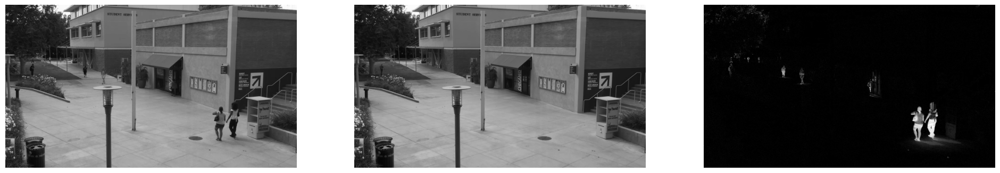

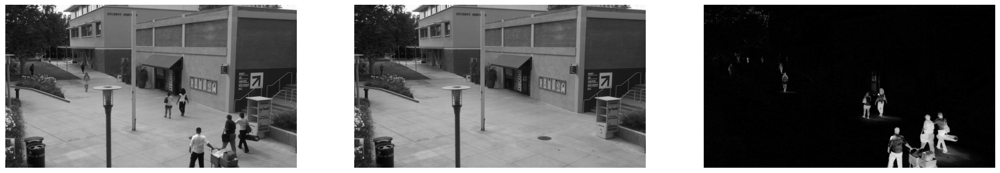

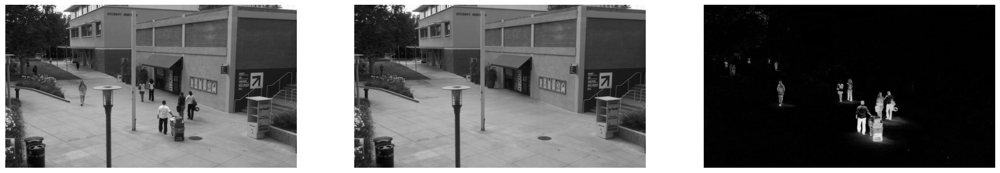

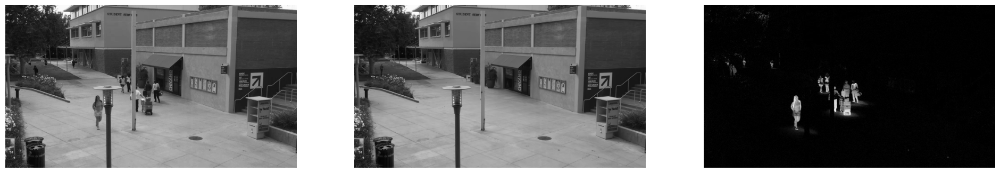

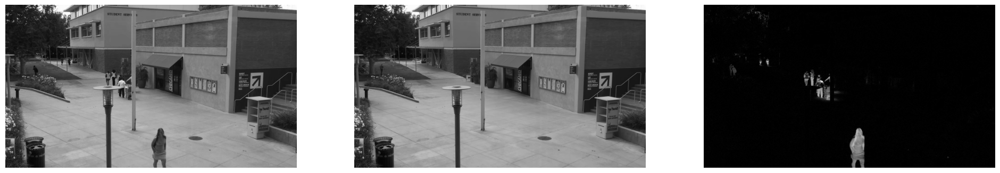

...

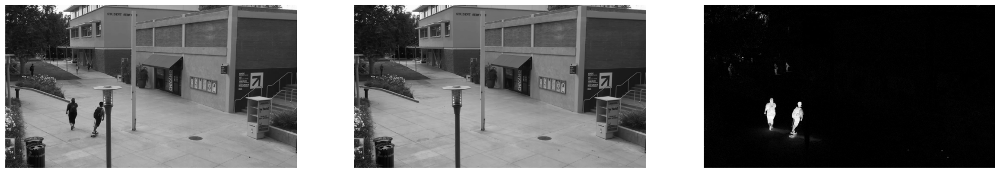

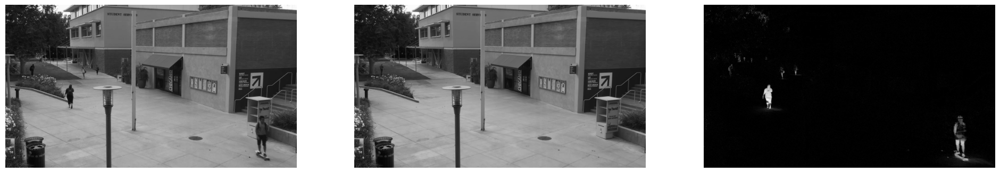

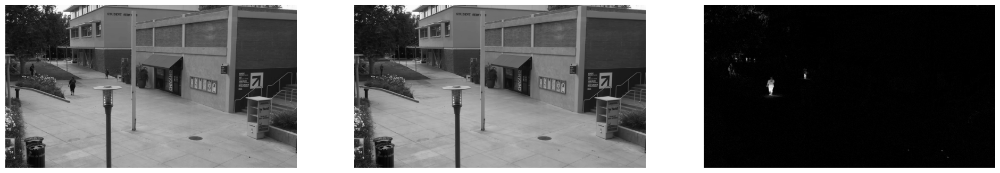

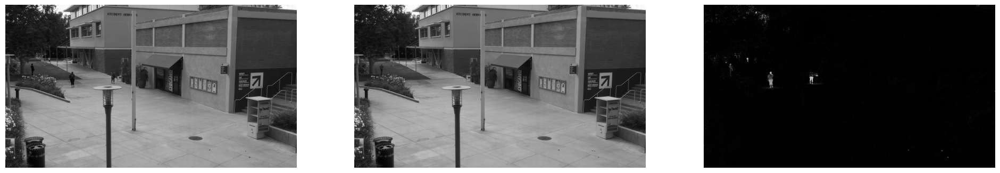

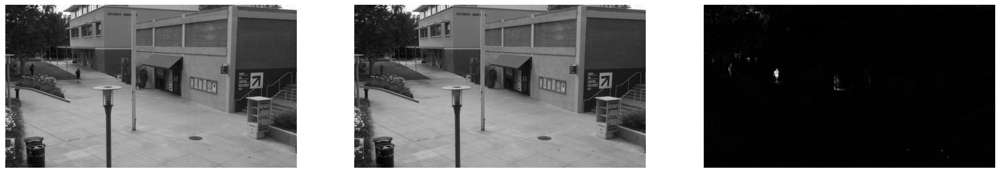

In [7]:
scl = 0.0125

for i in range(M.shape[1]):
    plt.figure(figsize=(3 * scl * w, scl * h))
    plt.subplot(1, 3, 1)
    plt.imshow(M[:, i].reshape(h, w), cmap='gray')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(L[:, i].reshape(h, w), cmap='gray')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(np.abs(S[:, i]).reshape(h, w), cmap='gray')
    plt.axis('off')